# MuZero MountainCar MDP Visualization

This document provides the code used to parse trained MuZero agents and experiment data for visualization of the learned MDP model. The notebook can be used to both visualize different parts of the learned model, or to generate plot data that can be viewed within our interactive tool.

In [1]:
import pickle
import typing
import json
import sys
import os
from copy import deepcopy
from functools import partial

import tensorflow as tf
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Step one directory back for imports and files.
sys.path.append('..')

import Agents
from Main import MNet, game_from_name, DotDict
from Games.Game import Game
from utils.game_utils import GymState
from utils.loss_utils import support_to_scalar
import MuZero
from MuZero.MuCoach import MuZeroCoach
from Coach import Coach

Using TensorFlow backend.


In [2]:
os.chdir('..')
os.getcwd()  # Project root: '...\\muzero'

'C:\\Users\\joery\\PycharmProjects\\muzero'

## Trained Model I/O

Once you have trained a MuZero agent on the MountainCar environment, you can specify the JSON configuration below that you used to train the agent. After running an (blindfolding) experiment using the learned agent, you can also specify it below as given by the examples.

This function will load in the run as a DotDict object which we'll use for generating plot data.

In [3]:
def load_run(config_file: str, game_id: str) -> typing.Tuple[DotDict, Game, MNet]:
    """
    Load in a MuZero agent by its JSON configuration
    :param config_file: str Path to JSON configuration file.
    :param game_id" str Accessing string for the environment
    """
    c = DotDict.from_json(config_file)
    g = game_from_name(game_id)
    
    net = MNet(g, c.net_args, c.architecture)
    net.load_checkpoint(c.args.load_folder_file[0], c.args.load_folder_file[1])
    
    return DotDict(file=config_file, config=c, game=g, net=net)


load_mc_run = partial(load_run, game_id='gym_MountainCar-v0')

In [4]:
my_runs = DotDict(
    l4_kl=load_mc_run("out/mc_out/latent_4_kl/MC_Base_kl_Gym_gym_MountainCar-v0_20210124-161620.json"),
    l8_kl=load_mc_run("out/mc_out/latent_8_kl/MC_Base_kl_Gym_gym_MountainCar-v0_20210124-162415.json"),
    l4_d=load_mc_run("out/mc_out/latent_4_dec/MC_Base_d_Gym_gym_MountainCar-v0_20201210-095502.json"),
    l8_d=load_mc_run("out/mc_out/latent_8_dec/MC_Base_d_Gym_gym_MountainCar-v0_20201211-155156.json"),
    l4=load_mc_run("out/mc_out/latent_4/MC_Base_Gym_gym_MountainCar-v0_20201203-204117.json"),
    l8=load_mc_run("out/mc_out/latent_8/MC_Base_Gym_gym_MountainCar-v0_20201130-111621.json")
)

my_runs.l4_kl.experiment = 'out/mc_out/latent_4_kl/MC_BlindfoldMuZero_l4_20201228-115025'
my_runs.l8_kl.experiment = 'out/mc_out/latent_8_kl/MC_BlindfoldMuZero_kl_20210125-080959'
my_runs.l4_d.experiment = 'out/mc_out/latent_4_dec/MC_BlindfoldMuZero_dec_20201228-115355'
my_runs.l8_d.experiment = 'out/mc_out/latent_8_dec/MC_BlindfoldMuZero_dec_20201228-115215'
my_runs.l4.experiment = 'out/mc_out/latent_4/MC_BlindfoldMuZero_l4_20201228-115311'
my_runs.l8.experiment = 'out/mc_out/latent_8/MC_BlindfoldMuZero_20201228-115052'

## State Space Enumeration and Embedding

The snippets below create a grid that enumerates the entire state space of the MountainCar environment and feeds this through the embedding function of a selected MuZero Agent.


In [5]:
agent = my_runs.l8  # The agent used as reference for visualization.

In [6]:
def create_grid(v_mins: typing.List, v_maxs: typing.List, resolution: int) -> np.ndarray:
    data = list(map(lambda r: np.linspace(*r, resolution), zip(v_mins, v_maxs)))
    grid = np.asarray(np.meshgrid(*data, indexing="ij")).T.reshape(-1, len(v_mins))
    return grid


def get_state_space(g: Game, resolution: int = 25) -> np.ndarray:
    obs_space = g.getInitialState().env.observation_space
    state_space = create_grid(obs_space.low, obs_space.high, resolution)
    return state_space


def embedding_manifold(state_space: np.ndarray, net: MNet, return_pis: bool = False) -> typing.Tuple:
    if len(state_space.shape) != 4:
        state_space = state_space[:, np.newaxis, np.newaxis, :]
        
    s, pis, vs = net.neural_net.forward.predict(state_space, batch_size=512)
   
    v_reals = support_to_scalar(vs, (vs.shape[-1] - 1) / 2)
    s = s.reshape(len(state_space), -1)

    if return_pis:
        return s, v_reals, pis
    
    return s, v_reals


In [7]:
delta = 250
state_space = get_state_space(agent.game, delta)

s, vs, *pis = embedding_manifold(state_space, agent.net)

print(state_space.shape, s.shape)

(62500, 2) (62500, 8)


## PCA 

We use PCA to project data within the learned MDP to the axis of largest variance. This allows us to visualize the largest portion of the embedding manifold and contrast it with the dynamics function.

In [8]:
def embedding_PCA(latent_states: np.ndarray, standardize: bool = False):   
    x = latent_states
    if standardize:
        x = (x - x.mean(axis=0)) / x.std(axis=0)
    
    # Perform PCA on latent dimensions
    pca = PCA(n_components=x.shape[-1])
    pca.fit(x)
    spcs = pca.fit_transform(x)
    
    # Create barchart
    ns = list(range(x.shape[-1]))
    var = pca.explained_variance_ratio_
    
    bar = plt.bar(ns, var)
    
    plt.title(f"PCA on latent-states (standardize={standardize})")
    plt.ylabel("Explained Variance Ratio")
    plt.xlabel("Principal Component")
    
    
    for i in range(len(var)):
        plt.annotate(f'{var[i]:.3f}', xy=(ns[i],var[i]), ha='center', va='bottom')

    plt.show()
    
    # Create violinplot
    plt.violinplot(spcs)
    plt.xticks(range(1, x.shape[-1]+1), range(1, x.shape[-1]+1))
    
    plt.title(f"Projected values distribution (standardize={standardize})")
    plt.ylabel("PC values")
    plt.xlabel("Principal Component")
    
    plt.show()
    
    return pca

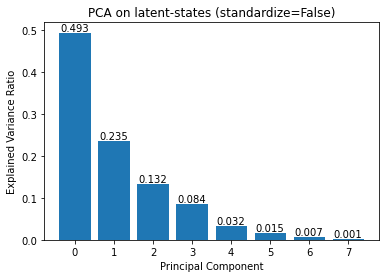

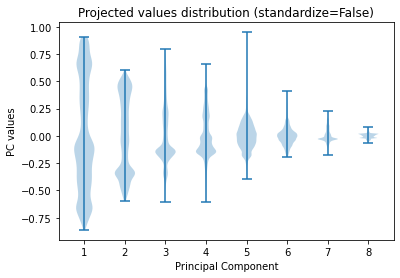

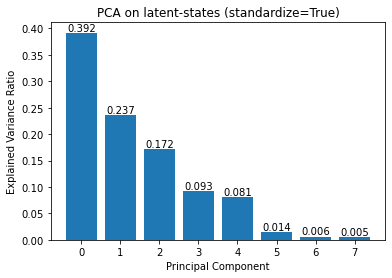

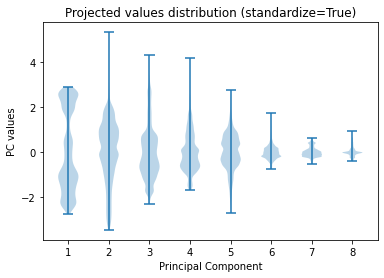

In [9]:
pca = embedding_PCA(s, False)
pca_norm = embedding_PCA(s, True)

pcs = pca.transform(s)

## Simple Helper Plots

Shows some simple value contour plots based on the state-space and the PC-projected space.

In [10]:
def to_grid(x: np.ndarray, delta: int) -> np.ndarray:
    return x.reshape(delta, delta)


def simple_PC_value_contour(pc_1: np.ndarray, pc_2: np.ndarray, z: np.ndarray) -> None:
    plt.scatter(pc_1, pc_2, c=z, alpha=0.5, s=5, cmap='rainbow')

    cbar = plt.colorbar()
    cbar.set_label(r'$V_\theta(o_t)$')

    plt.title("Value Contour MuZero PC-Space")
    plt.ylabel(r"First PCA component $h_\theta(o_t)$")
    plt.xlabel(r"Second PCA component $h_\theta(o_t)$")


def simple_MC_value_contour(x: np.ndarray, y: np.ndarray, z: np.ndarray) -> None:
    # Simple Example Figure for a 2-d env
    plt.title("Value Contour MuZero MountainCar")
    plt.ylabel("Velocity")
    plt.xlabel("Position")

    plt.contourf(x, y, z, levels=100, cmap='rainbow')

    cbar = plt.colorbar()
    cbar.set_label(r'$V_\theta(o_t)$')
    

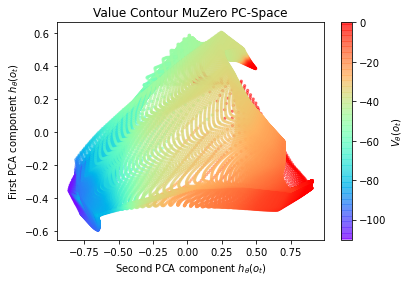

In [11]:
simple_PC_value_contour(pcs[:, 0], pcs[:, 1], vs)
plt.show()

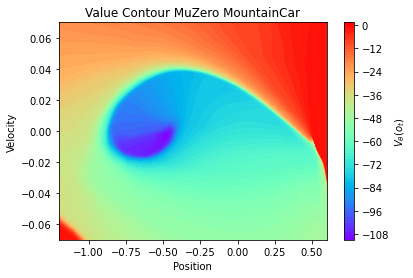

In [12]:
simple_MC_value_contour(to_grid(state_space[:,0], delta), to_grid(state_space[:,1], delta), to_grid(vs, delta))
plt.show()

## Abstract State Space Enumeration for PC-Space

The following snippet enumerates the entire latent MDP to create a value visualization of the learned space. This can become quite exhaustive when the latent dimensionality is large.

In [13]:
def extract_latents(pca: PCA, net: MNet, resolution: int = 25, project: bool = True):
    dims = np.prod(net.neural_net.encoder.output.shape[1:])
    
    latent_grid = create_grid(np.zeros(dims), np.ones(dims), resolution)
    
    pis, vs = net.neural_net.predictor.predict(latent_grid[..., np.newaxis], batch_size=512, verbose=1)
    
    acts = np.argmax(pis, axis=-1)

    a_planes = np.zeros_like(pis)
    a_planes[np.arange(len(pis)), acts] = 1
    
    rs, _ = net.neural_net.dynamics.predict([latent_grid[..., np.newaxis], a_planes], batch_size=512, verbose=1)
    
    # Cast distributional bins back to scalar values.
    vs = support_to_scalar(vs, (vs.shape[-1] - 1) / 2)
    rs = support_to_scalar(rs, (rs.shape[-1] - 1) / 2)
    
    if project:
        projected_states = pca.transform(latent_grid)

        return projected_states, vs, rs
    
    return latent_grid, vs, rs
    

In [14]:
# p_grid, p_vs, p_rs = extract_latents(pca, agent.net, delta // 16, project=False)

## Trajectory Generation with MDP Observation Sparsity

If the agent was run on an experiment ```agent.experiment``` the data gathered within this experiment is loaded in the code below. This allows us to plot control trajectories of the agent on both the neural network embedding, and the dynamics function. During generation of the dynamics function trajectories, there is the option to provide an observation frequency. This implies that the trajectory will be generated as a chain fully in the dynamics function for $n$ steps, and then refresh back to the embedding.

If no experiment was run, then we cannot visualize any trajectories.

In [15]:
def load_experiment(experiment_file: str, net: MNet) -> DotDict:
    with open(experiment_file + '.out', 'rb') as f:
        history = pickle.load(f)
      
    data = DotDict()
    for run in history:
        k, *_= run.keys()
        v = run.values()
        
        observations = list()
        actions = list()
        embeddings = list()
        
        for trajectory in list(*v):
            if len(trajectory) > 0:
                obs = np.asarray(trajectory.observations)
                acts = np.asarray(trajectory.actions)
                
                observations.append(obs)
                actions.append(acts)
                
                # Projected trajectories -- h(o_t). Not equal to latent trajectories!
                embeddings.append(net.neural_net.encoder.predict(obs, batch_size=512))
        
        data[k] = DotDict(observations=observations, actions=actions, embeddings=embeddings)
        
    # Update JSON data
    args = DotDict.from_json(experiment_file + '.json')
    
    players = DotDict()
    for p in args.args.players:
        players[p.name + '_' + str(p.config.refresh_freq)] = p
    
    results = DotDict()
    for r in args.results:
        results[r.player] = r
        
    args.args.players = players
    args.results = results
        
    return data, args


def get_latent_trajectory(embeddings: np.ndarray, actions: np.ndarray, g: Game, net: MNet, refresh_freq: int) -> np.ndarray:
    memory = embeddings[0][np.newaxis,...]
    
    latent_states = list()
    for i in range(len(embeddings)):
        if i % refresh_freq == 0:
            s = embeddings[i][np.newaxis, ...]
        else:
            # One hot encoding
            a = np.zeros((1, g.getActionSize()))
            a[:, actions[i]] = 1
            
            r, s = net.neural_net.dynamics.predict([memory, a])
        
        memory = s
        latent_states.append(s)
        
    stacked = np.concatenate(latent_states)
    return stacked

In [16]:
trajectories, args = load_experiment(agent.experiment, agent.net)

In [17]:
x = 1                                                 # Change this variable to switch between trajectories.
sample = trajectories.r0c1_BlindMuZeroPlayer_MC_Base  # Change this variable to switch between tested agents. 

sample_trajectory = get_latent_trajectory(sample.embeddings[x], sample.actions[x], agent.game, agent.net, 200)

# Project to PC-space
pc_embedding_trajectory = pca.transform(sample.embeddings[x].reshape(len(sample.embeddings[x]), -1))
pc_dynamics_trajectory = pca.transform(sample_trajectory.reshape(len(sample_trajectory), -1))

### Trajectory distribution divergence

The violinplots below show the difference between the distributions represented between the trajectory embedding and dynamics function chain for both non- and PCA-projected trajectories. This should give an indication of how far $g_\theta$ diverges from $h_\theta$.

In [18]:
pcs.shape

(62500, 8)

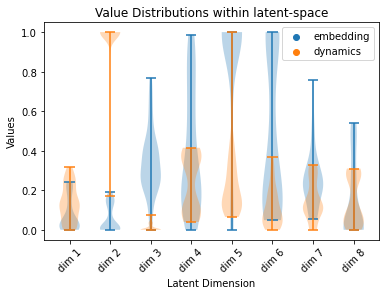

In [19]:
plt.violinplot(sample.embeddings[x].reshape(len(sample.embeddings[x]), -1), np.arange(1, s.shape[-1] + 1))
plt.violinplot(sample_trajectory.reshape(len(sample_trajectory), -1), np.arange(1, s.shape[-1] + 1))

plt.scatter([], [], label='embedding')
plt.scatter([], [], label='dynamics')

plt.title("Value Distributions within latent-space")

plt.ylabel("Values")
plt.xlabel("Latent Dimension")
plt.xticks(range(1, s.shape[-1] + 1), [f'dim {i}' for i in range(1, s.shape[-1] + 1)], rotation=45)

plt.legend()
plt.show()

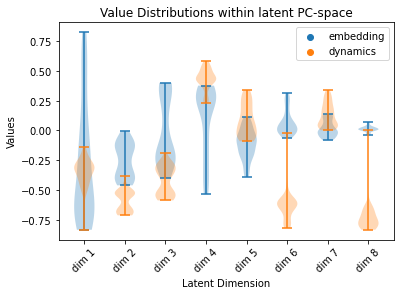

In [20]:
plt.violinplot(pc_embedding_trajectory, np.arange(1, s.shape[-1] + 1))
plt.violinplot(pc_dynamics_trajectory, np.arange(1, s.shape[-1] + 1))

plt.scatter([], [], label='embedding')
plt.scatter([], [], label='dynamics')

plt.title("Value Distributions within latent PC-space")

plt.ylabel("Values")
plt.xlabel("Latent Dimension")
plt.xticks(range(1, s.shape[-1] + 1), [f'dim {i}' for i in range(1, s.shape[-1] + 1)], rotation=45)

plt.legend()
plt.show()

## Trajectory and Abstract MDP Visualization in Plotly

Below lies the heart of our visualization, which provides an interactive visualization of the learned MDP along with the generated trajectories.

In [21]:
def generate_3d_surface(x: np.ndarray, y: np.ndarray, z: np.ndarray, colors: np.ndarray, clim=None):
    return go.Surface(
        x=x, y=y, z=z,
        opacity=1, 
        surfacecolor=colors,
        colorscale='Viridis',
        cmin=colors.min() if clim is None else clim[0],
        cmax=colors.max() if clim is None else clim[1],
        colorbar=dict(title=dict(text='V',side='top'), thickness=50, tickmode='array')
    )

def generate_3d_trajectory(x: np.ndarray, y: np.ndarray, z: np.ndarray, color: str):
    return go.Scatter3d(
        x=x + np.random.rand()*0.01,
        y=y + np.random.rand()*0.01,
        z=z + np.random.rand()*0.01,
        mode='lines+markers',
        marker=dict(
            size=3,
            symbol='x',
            color=color,
            opacity=1
        ),
        line=dict(
            color=color,
            width=20
        )
    )

def generate_3d_valuefield(x: np.ndarray, y: np.ndarray, z: np.ndarray, colors: np.ndarray, clim=None):
    return go.Scatter3d(
        x=x, y=y, z=z,
        mode='markers',
        marker=dict(
            size=4,
            color=colors,
            colorscale='Viridis',
            cmin=colors.min() if clim is None else clim[0],
            cmax=colors.max() if clim is None else clim[1],
            opacity=1,
            colorbar=dict(title=dict(text='V',side='top'), thickness=50, tickmode='array')
        ),
    )

In [22]:
x = 3
dynamics_trajectory =  generate_3d_trajectory(
    pc_dynamics_trajectory[:, 0].ravel(),
    pc_dynamics_trajectory[:, 1].ravel(), 
    pc_dynamics_trajectory[:, 2].ravel(), 'grey')

embedding_trajectory = generate_3d_trajectory(
    pc_embedding_trajectory[:, 0].ravel(), 
    pc_embedding_trajectory[:, 1].ravel(), 
    pc_embedding_trajectory[:, 2].ravel(), 'black')

surface = generate_3d_valuefield(pcs[:,0], pcs[:,1], pcs[:,2], vs)

fig = go.Figure(data=[embedding_trajectory, dynamics_trajectory, surface])

# tight layout
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

fig.show()

## Data Generation Pipeline
The following function wraps all code shown above into one pipeline to generate plot data for our interactive tool. To generate plot data, simply feed in your agent along with observation sparsities for the dynamics function and a resolution integer for the grid.

In [51]:
def generate_data(my_run_name: str, my_run: DotDict, delta: int, dynamics_sparsities: typing.Tuple[int, ...]):
    # Generate encoder embedding
    obs_space = my_run.game.getInitialState().env.observation_space
    state_space = get_state_space(my_run.game, delta)
    s, vs, *pis = embedding_manifold(state_space, my_run.net)
    
    print(state_space.shape, s.shape)
    
    # Get embedding in non-standardized PC-space (as latent dimensions are uniformly scaled).
    pca = embedding_PCA(s, False)
 
    # Get control trajectories from experiment.
    trajectories, args = load_experiment(my_run.experiment, my_run.net)
    
    i = 0
    trajectory_collect = list()
    for run_key, config_key in zip(trajectories.keys(), args.args.players.keys()):
        print(run_key, config_key)
        trajectory_data = DotDict()
        
        trajectory_data.test_sparsity = args.args.players[config_key].config.refresh_freq
        trajectory_data.rewards = args.results[run_key].trial_result
        
        trajectory_data.states = [x.astype(np.float16).tolist() for x in trajectories[run_key].observations]
        trajectory_data.embeddings = [x.astype(np.float16)[..., 0].tolist() for x in trajectories[run_key].embeddings]
        trajectory_data.actions = [x.astype(np.float16).tolist() for x in trajectories[run_key].actions]
        
        trajectory_data.dynamics = list()
        
        for sparsity in dynamics_sparsities:
            collection = DotDict()
            
            dynamics = list()
            for embedding_trajectory, action_trajectory in zip(trajectories[run_key].embeddings, trajectories[run_key].actions):
                trajectory = get_latent_trajectory(embedding_trajectory, action_trajectory, my_run.game, my_run.net, sparsity)
                dynamics.append(trajectory.astype(np.float16)[..., 0].tolist())

            collection.value = dynamics
            collection.test_sparsity = sparsity
            trajectory_data.dynamics.append(collection)
        
        # Finally store dynamics trajectories in container.
        trajectory_collect.append(trajectory_data)
    
    container = {
        'environment': my_run.game.env_name,
        'input_domain': [obs_space.low.tolist(), obs_space.high.tolist()],
        'manifold': {
            'embedding': s.astype(np.float16).tolist(),
            'projection': { 'mean': pca.mean_.astype(np.float16).tolist(), 'components': pca.components_.astype(np.float16).tolist() },
            'colors': { 'value': vs.astype(np.float16).tolist() }
        },
        'trajectories': trajectory_collect
    }
            
    
    return container

(62500, 2) (62500, 4)


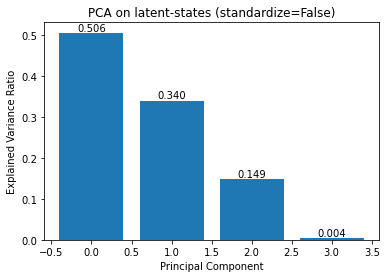

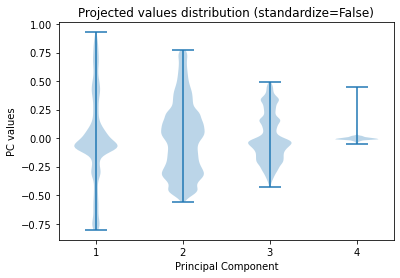

r0c0_BlindMuZeroPlayer_MC_Base_d BLIND_MUZERO_1
r0c1_BlindMuZeroPlayer_MC_Base_d BLIND_MUZERO_5
r0c2_BlindMuZeroPlayer_MC_Base_d BLIND_MUZERO_10
r0c3_BlindMuZeroPlayer_MC_Base_d BLIND_MUZERO_25
r0c4_BlindMuZeroPlayer_MC_Base_d BLIND_MUZERO_50
r0c5_BlindMuZeroPlayer_MC_Base_d BLIND_MUZERO_100
r0c6_BlindMuZeroPlayer_MC_Base_d BLIND_MUZERO_200


In [64]:
# Example line: generate_data('my_run', my_runs.my_agent, int, [int, ...])
data = generate_data('l4_dec', my_runs.l4_d, 250, [1, 5, 10, 25, 50, 100, 200])

## Plot Data I/O
After saving the plot data as a JSON, you can drag the data file into our tool to visualize the agent with a neat interface! For a delta of 500 and 4 latent dimensions, we found that files were on average ~30MB. For storage, these files can be compressed quite well with usually a 1:3 ratio.

In [74]:
np.asarray(data['trajectories'][0]['embeddings'][0]).shape

(103, 4)

In [65]:
with open("plotdata_l4_dec.json", "w") as f:
    json.dump(data, f)

In [ ]:
del data

# Experiment: Observation Sparsity Plots

In this part of the notebook we only analyze/ visualize the numerical results from the experiments for the MuZero agents. This experiment performed trials on MuZero when receiving observation with a sparsity frequency $x$. The figures illustrate how empirical performance degrades when relying more on MuZero's internal model.

In [ ]:
import pandas as pd
from matplotlib import ticker

In [ ]:
# Collect experiment numerical results neatly in a pandas DataFrame for convenience.
data = dict()

for run in my_runs.keys():
    my_runs[run].experiment
    _, experiment_config = load_experiment(my_runs[run].experiment, my_runs[run].net)
    
    # Extract the cumulative rewards for each episode in the environment during testing.
    results = [x['trial_result'] for x in experiment_config.results.values()]
    data[run] = results
    
df = pd.DataFrame(data)
df

In [ ]:
# Create plot data from the pandas DataFrame in logical order.
order = ['l4', 'l4_kl', 'l4_d', 'l8', 'l8_kl', 'l8_d']

ordered = df[order]
means = ordered.applymap(np.mean)
stds = ordered.applymap(np.std)  # Not actually used.

The snippet below generates a figure for the mean trial rewards as a function of the agent's observation sparsity.

In [ ]:
fig = plt.figure(figsize=(7, 5))

for l, c, s in zip(order, ['black', u'#1593FF', 'red', 'black', u'#1593FF', 'red'], ['--'] * 3 + ['-'] * 3):
    plt.plot([1, 5, 10, 25, 50, 100, 200], means[l], color=c, linestyle=s)

labels = [r'MuZero', r'MuZero $h^{-1}_\theta$', r'MuZero $D_{KL}(h_{\theta} \: \vert \vert \: g_{\theta})$']
colors = ['black', 'red', u'#1593FF']
for l, c in zip(labels, colors):
    plt.plot([], [], label=l, c=c)

plt.hlines(-110, -10, 2100, color='grey', label='MDP Solved')

plt.title("Blindfolded MountainCar: Mean Trial Rewards (solid $L=8$; dashed $L=4$)\n", fontsize=14)
plt.ylabel('Average Trial Rewards $n=10$', fontsize=14)
plt.xlabel("Observation Sparsity (Refresh Frequency)", fontsize=14)

plt.xscale('log')
plt.xlim([0.9, 210])
plt.ylim([-205, -90])

ax = plt.gca()
ax.set_xticks([1, 5, 10, 25, 50, 100, 200])
ax.get_xaxis().set_major_formatter(ticker.ScalarFormatter())

plt.legend(fontsize=13, loc='lower left')

plt.tight_layout()
plt.savefig('out/figures/MC_Blindfold.svg', format='svg')
plt.show()

## Publication Figure: Evolution of MDP Model

The code below generates partial figures that we used to illustrate how the MDP embedding took shape over time along with violinplots to indicate the increase in variance. These partial figures were later combined using a vector graphics tool (we used inkscape). To generate figures yourself, specify an agent below ```copy = my_agent.copy()``` and specify the model checkpoint to create figures for.

In [ ]:
checkpoint = 200  # We used 30, 40, 50, and 200.

copy = agent.copy()
copy.config.args.load_folder_file[1] = f'checkpoint_{checkpoint}.pth.tar'
copy.net.load_checkpoint(*copy.config.args.load_folder_file)
    
data = generate_data('l4', copy, 500, [1])

In [ ]:
x = 3

t_d = np.asarray(data['trajectories'][x]['dynamics'][0]['value'][0])
t_e = np.asarray(data['trajectories'][x]['embeddings'][0])

s = np.asarray(data['manifold']['embedding'])
pcs = (s - np.asarray(data['manifold']['projection']['mean'])).dot(np.asarray(data['manifold']['projection']['components']).T)

vs = np.asarray(data['manifold']['colors']['value'])
delta = np.sqrt(len(s)).astype(int)

In [ ]:
fig = plt.figure(figsize=(14,8))
ax = fig.add_subplot(111, projection='3d')

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white (or whatever is "invisible")
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')
ax.grid(False)

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])

fig.patch.set_visible(False)
# ax.axis('off')

s = ax.scatter(pcs[:,0], pcs[:,1], pcs[:,2], c=vs, alpha=1, vmin=-120, vmax=0, rasterized=True)
ax.set_facecolor((1, 1, 1, 1))

ax.view_init(-45, 135 + 180)
plt.colorbar(s, ax=ax)
plt.tight_layout()
# plt.savefig(f'out/figures/MC_MDP_{checkpoint}.svg', format='svg', dpi=200)
plt.show()

In [ ]:
plt.figure(figsize=(7, 5))

plt.violinplot(np.asarray(data['manifold']['embedding']))

plt.ylabel(r"Element Values of $h_\theta(o_t), \forall o_t$", fontsize=14)
plt.xticks(range(1, 5), ['Dim 1','Dim 2','Dim 3','Dim 4'])

plt.tight_layout()
# plt.savefig(f'out/figures/MC_embeddingViolin_{checkpoint}.svg', format='svg')
plt.show()

## Publication Figure: Dynamics Vs. Embedding

The code below generates partial figures that we used to contrast the embedding with the dynamics function for one MuZero model.

In [ ]:
with open("out/mc_out/plotdata_l8.json", "rb") as f:
    data = json.load(f)

In [ ]:
x = -1
b = -1

di = iter(data['trajectories'][x]['dynamics'][b]['value'])
ei = iter(data['trajectories'][x]['embeddings'])
si = iter(data['trajectories'][x]['states'])

t_d = lambda: np.asarray(next(di))[...,0]
t_e = lambda: np.asarray(next(ei))[...,0]
t_s = lambda: np.asarray(next(si))[:,0,0,:]

s = np.asarray(data['manifold']['embedding'])
project = lambda x: (x - np.asarray(data['manifold']['projection']['mean'])).dot(np.asarray(data['manifold']['projection']['components']).T)
pcs = project(s)

t_d_pc = lambda: project(t_d())
t_e_pc = lambda: project(t_e())

vs = np.asarray(data['manifold']['colors']['value'])
delta = np.sqrt(len(s)).astype(int)


fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(111, projection='3d')

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])

fig.patch.set_visible(False)

for s in ['-', 'dotted', '--', 'dashdot']:
    te = t_e_pc()
    td = t_d_pc()

    b = ax.scatter(xs=te[0,0], ys=te[0,1], zs=te[0,2], marker='o', s=100, facecolor='black', linewidth=2)
    
    ee = ax.scatter(xs=te[-1,0], ys=te[-1,1], zs=te[-1,2], marker='x', 
                    s=100, edgecolor='black', facecolor=u'#1593FF', linewidth=5)
    
    ed = ax.scatter(xs=td[-1,0], ys=td[-1,1], zs=td[-1,2], marker='x', 
                    s=100, facecolor=(59/255,179/255,21/255, 1), edgecolor='black', linewidth=5)
    
    
    e = ax.plot(xs=te[:,0], ys=te[:,1], zs=te[:,2], linewidth=3, linestyle=s, c=u'#1593FF')
    d = ax.plot(xs=td[:,0], ys=td[:,1], zs=td[:,2], linewidth=3, linestyle=s, c=(59/255,179/255,21/255))

ax.set_facecolor((1, 1, 1, 1))

ax.view_init(30, 270)
# plt.colorbar(s, ax=ax)
plt.tight_layout()
plt.savefig(f'out/figures/MC_MDP_l4kl_trajectory.svg', format='svg')
plt.show()

In [ ]:
state_space = get_state_space(my_runs.l4.game, delta).round(5)
bar = np.tile(['black'] * 5 + ['w'] * 5,  len(vs) // 10)

plt.figure(figsize=(7, 10))

plt.subplot(2, 1, 1)
plt.scatter(state_space[:, 0], state_space[:, 1], c=bar, s=1, rasterized=True)

plt.title("State-Space Grid MountainCar", fontsize=14)
plt.ylabel("Cart Velocity", fontsize=14)
plt.xlabel("Cart Position", fontsize=14)
plt.colorbar()

plt.subplot(2, 1, 2)
plt.scatter(state_space[:, 0], state_space[:, 1], c=vs, vmin=-120, vmax=0, rasterized=True, s=1)

for s in ['-', 'dotted', '--', 'dashdot']:
    ts = t_s()
    ts.reshape((len(ts), 2))

    plt.scatter(ts[0,0], ts[0,1], marker='o', s=50, color='black', linewidth=2)
    plt.scatter(ts[-1,0], ts[-1,1], marker='x',  s=50, color='black', linewidth=5)
    
    plt.plot(ts[:,0], ts[:,1], linewidth=3, linestyle=s, c=u'black')

plt.title("MuZero Value Contour MountainCar", fontsize=14)
plt.ylabel("Cart Velocity", fontsize=14)
plt.xlabel("Cart Position", fontsize=14)
plt.colorbar()

plt.tight_layout()

plt.savefig('out/figures/MC_contour.svg', format='svg')
plt.show()

In [ ]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])

fig.patch.set_visible(False)

sub=1
ax.scatter(pcs[:,0][::sub], pcs[:,1][::sub], pcs[:,2][::sub], c=bar[::sub], alpha=0.3, rasterized=True)
ax.set_facecolor((1, 1, 1, 1))

ax.view_init(30, 270)
# plt.colorbar(s, ax=ax)
plt.tight_layout()
plt.savefig(f'out/figures/MC_MDP_l8_embedding_bars.svg', format='svg', dpi=200)
plt.show()

In [ ]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')

ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])

fig.patch.set_visible(False)

sub=3
ax.scatter(pcs[:,0][::sub], pcs[:,1][::sub], pcs[:,2][::sub], c=vs[::sub], alpha=0.3, rasterized=True)
ax.set_facecolor((1, 1, 1, 1))

ax.view_init(30, 270)
# plt.colorbar(s, ax=ax)
plt.tight_layout()
plt.savefig(f'out/figures/MC_MDP_l8_embedding_vs.svg', format='svg', dpi=200)

plt.show()

**Figure Generation Automated blocks:**

In [ ]:
def generate_pointcloud_trajectory(data, run):
    x = -1
    b = -1

    di = iter(data['trajectories'][x]['dynamics'][b]['value'])
    ei = iter(data['trajectories'][x]['embeddings'])
    si = iter(data['trajectories'][x]['states'])

    t_d = lambda: np.asarray(next(di))[...,0]
    t_e = lambda: np.asarray(next(ei))[...,0]
    t_s = lambda: np.asarray(next(si))[:,0,0,:]

    s = np.asarray(data['manifold']['embedding'])
    project = lambda x: (x - np.asarray(data['manifold']['projection']['mean'])).dot(np.asarray(data['manifold']['projection']['components']).T)
    pcs = project(s)

    t_d_pc = lambda: project(t_d())
    t_e_pc = lambda: project(t_e())

    vs = np.asarray(data['manifold']['colors']['value'])
    delta = np.sqrt(len(s)).astype(int)


    fig = plt.figure(figsize=(30,15))
    ax = fig.add_subplot(121, projection='3d')


    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    fig.patch.set_visible(False)

    sub=1
    ax.scatter(pcs[:,0][::sub], pcs[:,1][::sub], pcs[:,2][::sub], c=vs[::sub], alpha=0.3, rasterized=True)
    ax.set_facecolor((1, 1, 1, 1))

    ax.view_init(30, 270)
#     # plt.colorbar(s, ax=ax)
#     plt.tight_layout()
#     plt.savefig(f'out/figures/MC_MDP_{run}_embedding_vs.svg', format='svg', dpi=200)
#     plt.show()
    
    
    ax = fig.add_subplot(122, projection='3d')

    ax.xaxis.pane.fill = False
    ax.yaxis.pane.fill = False
    ax.zaxis.pane.fill = False

    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])

    fig.patch.set_visible(False)

    for s in ['-', 'dotted', '--', 'dashdot']:
        te = t_e_pc()
        td = t_d_pc()

        b = ax.scatter(xs=te[0,0], ys=te[0,1], zs=te[0,2], marker='o', s=100, facecolor='black', linewidth=2)

        ee = ax.scatter(xs=te[-1,0], ys=te[-1,1], zs=te[-1,2], marker='x', 
                        s=100, edgecolor='black', facecolor=u'#1593FF', linewidth=5)

        ed = ax.scatter(xs=td[-1,0], ys=td[-1,1], zs=td[-1,2], marker='x', 
                        s=100, facecolor=(59/255,179/255,21/255, 1), edgecolor='black', linewidth=5)


        e = ax.plot(xs=te[:,0], ys=te[:,1], zs=te[:,2], linewidth=3, linestyle=s, c=u'#1593FF')
        d = ax.plot(xs=td[:,0], ys=td[:,1], zs=td[:,2], linewidth=3, linestyle=s, c=(59/255,179/255,21/255))

    sub=10
    # ax.scatter(pcs[:,0][::sub], pcs[:,1][::sub], pcs[:,2][::sub], c=vs[::sub], rasterized=True)
    ax.set_facecolor((1, 1, 1, 1))

    ax.view_init(30, 270)
    # plt.colorbar(s, ax=ax)
    plt.tight_layout()
    plt.savefig(f'out/figures/MC_MDP_{run}_combined.svg', format='svg', dpi=200)
    plt.show()

In [ ]:
runs = ['l4', 'l8', 'l4_kl', 'l8_kl', 'l4_dec', 'l8_dec']

for run in runs:
    with open(f"out/mc_out/plotdata_{run}.json", "rb") as f:
        data = json.load(f)
        generate_pointcloud_trajectory(data, run)

# Appendix: Hypothetical Illustration of MDP Abstraction

The snippets below generate base figures that we use for illustrating the concept behind the MDP learning in our report. The code is not neccesary to run in order to use our tool.

In [ ]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure(figsize=(6, 6))
ax = fig.gca(projection='3d')
plt.grid(None)

# Make data.
X = np.arange(-5, 5, 2)
Y = np.arange(-5, 5, 2)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = np.sin(R)

# Plot the surface.
surf = ax.plot_wireframe(X, Y, np.zeros_like(Z), color='black', linewidth=.1, antialiased=False)
surf = ax.plot_surface(X, Y, np.zeros_like(Z), color='grey', alpha=0.2, linewidth=.1, antialiased=False)


ax.plot([-3, -2.5, -2, -1, 0, 2.2, -0.5, 2], [-1, -1/2, 0, 1/2, 2.5, 2, -2, -3.5], linewidth=5, color='black', linestyle='--')
ax.scatter([-3], [-1], s=500, marker='X', color='black')
ax.scatter([2], [-3.5], s=500, marker='o', color='black')

# Customize the z axis.
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

ax.w_zaxis.line.set_lw(0.)
ax.set_zticks([])

plt.tight_layout()
plt.savefig("real.svg")
plt.show()

In [ ]:
# This import registers the 3D projection, but is otherwise unused.
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401 unused import

from itertools import combinations, product

import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np

fig = plt.figure(figsize=(6, 6))
ax = fig.gca(projection='3d')
plt.grid(None)

# Make data.
X = np.arange(0, 1.1, 0.15)
Y = np.arange(0, 1.1, 0.15)
X, Y = np.meshgrid(X, Y)
R = np.sqrt(X**2 + Y**2)
Z = (1-np.sin(2 * R)) /2 + 1/4

# draw cube
r = [0, 1]
for s, e in combinations(np.array(list(product(r, r, r))), 2):
    if np.sum(np.abs(s-e)) == r[1]-r[0]:
        ax.plot3D(*zip(s, e), color="b", linestyle='--')


# Plot the surface.
surf = ax.plot_wireframe((np.clip(1 - np.sqrt(np.cos(np.exp(0.9 * Y)) ** 2), 0, 1)), np.clip(X ** 3, 0, 1), Z, color='black', linewidth=.1, antialiased=False)
surf = ax.plot_surface((np.clip(1 - np.sqrt(np.cos(np.exp(0.9 * Y)) ** 2), 0, 1)), np.clip(X ** 3, 0, 1), Z, color='grey', alpha=0.2, linewidth=.1, antialiased=False)


# Customize the z axis.
ax.set_zlim(0, 1.0)
ax.zaxis.set_major_locator(LinearLocator(10))
ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# make the grid lines transparent
ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)

ax.plot([0.6, 0.5, 0.45, 0.4, 0.35, 0.3, 0.25, 0.0], 
        [0.6, 0.8, 0.8, 0.7, 0.6, 0.55, 0.5, 0.4], 
        [0.7, 0.75, 0.8, 0.82, 0.8, 0.6, 0.5, 0.4],
        linewidth=5, color='black', linestyle='--')

ax.scatter(0.6, 0.6, 0.7, s=500, marker='o', color='black')
ax.scatter([0.0], [0.4], [0.4], s=500, marker='X', color='black')

plt.tight_layout()

plt.savefig('abstract.svg')
plt.show()